# Equação da onda acústica de 2ª ordem - Densidade constante

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from plot_functions import plot_animated_wavefield, plot_shotrecord

from examples.seismic import Model, plot_velocity, RickerSource, AcquisitionGeometry, Receiver
from devito import *

configuration['log-level'] = 'WARNING'

%matplotlib inline

## Parâmetros dos operadores de diferenças finitas

In [2]:
space_order=16
time_order=2

## Definição do modelo

## Dimensões do modelo

O modelo possui dimensões $w \times h = 2000\ \mathrm{m} \times 2000\ \mathrm{m}$, e um espaçamento de $\Delta x = \Delta z = 10\ \mathrm{m}$. Logo, a malha deverá ter 
$$
n_x = \frac{w}{\Delta x} + 1 = \frac{2000\ \mathrm{m}}{10\ \mathrm{m}} + 1 = 201
$$
pontos ao longo do eixo x, e
$$
n_z = \frac{h}{\Delta z} + 1 = \frac{2000\ \mathrm{m}}{10\ \mathrm{m}} + 1 = 201
$$
pontos ao longo do eixo z.

In [3]:
shape = (201, 201)
spacing = (10., 10.)
origin = (0., 0.)
nbl=201

### Parâmetros físicos

<!-- O modelo possui 2 camadas, cujas velocidades de propagação $v_P$ são $1.5$ $\mathrm{km/s}$ e $2$ $\mathrm{km/s}$, respectivamente. -->

In [4]:
vp = 1.5 * np.ones(shape, dtype=np.float32)

CASO_HOMOGENEO = True
# Remova o comentário das linhas abaixo para gerar um modelo de duas camadas
# vp[:, shape[1]//2:] = 2.5
# CASO_HOMOGENEO = False

In [5]:
model = Model(vp=vp, origin=origin, shape=shape, spacing=spacing,
              space_order=space_order, nbl=nbl, bcs="damp")

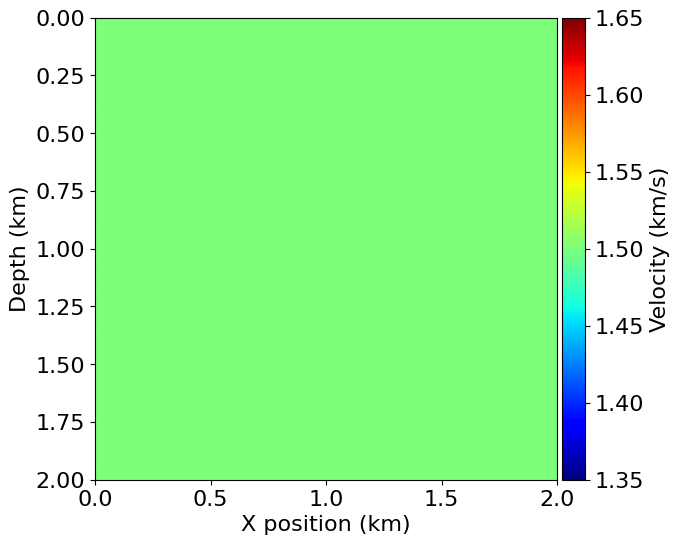

In [6]:
plot_velocity(model)

## Parâmetros da aquisição

### Tempo de aquisição

O período de aquisição inicia em $t_0 = 0$ $\mathrm{ms}$ e termina em $t_n = 2000$ $\mathrm{ms}$. O comprimento do passo temporal, $\Delta t$, foi escolhido como o $\Delta t_{\text{crítico}}$ que, embora tenha sido calculado por outro método, satisfaz a condição de estabilidade:
$$
\Delta t \le \frac{1}{\max(v_P)\sqrt{\dfrac{1}{\Delta x^2} + \dfrac{1}{\Delta z^2}}}
$$

In [7]:
t0 = 0.  # ms
tn = 1500. # ms
dt = model.critical_dt

### Geometria

Como o valor mínimo do campo de velocidade é $1.5\ \mathrm{km/s}$, o espaçamento do modelo é $\Delta x = \Delta z = 10 \mathrm{m}$ e a ordem do operador de diferenças finitas para as derivadas espaciais é igual a $16$ ($F = 2$), a frequência máxima $f_{\mathrm{max}}$ da onda propagada deve satisfazer
$$
\begin{aligned}
f_{\mathrm{max}} &\le \frac{\min{v_P}}{F\max{\Delta x, \Delta z}}\\
    &= \frac{1.5\ \mathrm{km/s}}{2 \times 10\ \mathrm{m}}\\
    &= 0.075\ \mathrm{kHz}
\end{aligned}
$$
A assinatura da fonte será a fonte de Ricker, que possui uma frequência de pico $f_{\mathrm{peak}} \approx \dfrac{1}{3} f_{\mathrm{max}}$. Com base nisto, foi escolhida uma frequência máxima de $0.03\ \mathrm{kHz}$, resultando numa frequência de pico igual a $0.01\ \mathrm{kHz}$.

In [8]:
# Frequência de pico da fonte
f0 = 0.010

In [9]:
zero_coords = np.array([[0,0]], dtype=model.dtype) # Para zerar as coordenadas da fonte e dos receptores da geometria.
geometry = AcquisitionGeometry(model, zero_coords, zero_coords, t0, tn)
geometry.resample(dt)

time_range = geometry.time_axis

Será utilizada uma fonte de Ricker posicionada no canto superior esquerdo do modelo

In [10]:
src = RickerSource(name='src', grid=model.grid, f0=f0,
                   npoint=1, time_range=time_range)

src.coordinates.data[0, 0] = model.domain_size[0]/2
src.coordinates.data[0, 1] = model.domain_size[1]/2

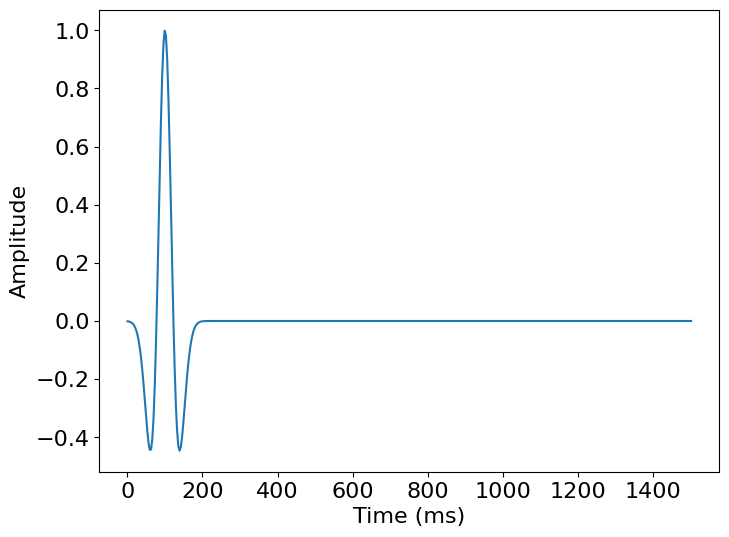

In [11]:
src.show() # Assinatura da fonte

Há um receptor para cada ponto da malha na superfície ($z = 0$). Logo, existem $n_{\mathrm{rec}} = 151$ receptores espaçados por $10$ $\mathrm{m}$. O receptor lê apenas o campo $P$.

In [12]:
rec = Receiver(name='rec', grid=model.grid, time_range=time_range, npoint=shape[0])

rec.coordinates.data[:, 0] = np.linspace(model.origin[0], model.domain_size[0], dtype=model.dtype, num=shape[0])
rec.coordinates.data[:, 1] = 0

#### Posição da fonte

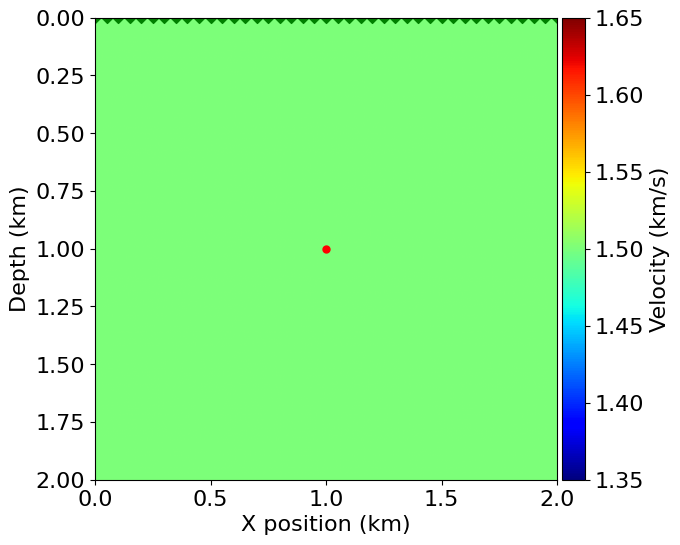

In [13]:
plot_velocity(model, source=src.coordinates.data, receiver=rec.coordinates.data[::5])

## Definição da equação da onda acústica de 2ª ordem

Aqui é definida no *Devito* a equação

$$
\frac{1}{v_P^2}\frac{\partial^2 P}{\partial t^2} - \nabla^2 P = S
$$

em que:

- $P$ é o campo de pressão;
- $v_P$ é o campo de velocidade da onda P;
- $S$ é o termo fonte;

In [14]:
# Função para o campo de pressão
P = TimeFunction(name="P", grid=model.grid, time_order=time_order, space_order=space_order, staggered=NODE)

Cria-se uma `TimeFunction` auxiliar para armazenar os campos de pressão. São salvos 60 campos distribuidos ao longo do período de aquisição.

In [15]:
nsnaps = 60
factor = geometry.nt//nsnaps
time_subsampled = ConditionalDimension(name='tsub', parent=model.grid.time_dim, factor=factor)
Psave = TimeFunction(name="Psave", grid=model.grid, time_order=time_order, space_order=space_order, 
                     staggered=NODE, save=nsnaps, time_dim=time_subsampled)

Define-se as EDPs

In [16]:
vp = model.vp

In [17]:
# Equação da onda acústica de 2ª ordem
EDP = 1/vp**2 * P.dt2 - P.laplace
EDP

-Derivative(P(t, x, y), (x, 2)) - Derivative(P(t, x, y), (y, 2)) + Derivative(P(t, x, y), (t, 2))/vp(x, y)**2

Gera-se os *stencils* para a expressão do campo de ondas futuro com base nestas EDPs e o stencil para armazenar o campo $P$.

In [18]:
# Expressão para o campo de ondas futuro, P(r, t + dt)
stencil = Eq(P.forward, solve(EDP, P.forward))
stencil_Psave = Eq(Psave, P)
stencil

Eq(P(t + dt, x, y), dt**2*(-(-2.0*P(t, x, y)/dt**2 + P(t - dt, x, y)/dt**2)/vp(x, y)**2 + Derivative(P(t, x, y), (x, 2)) + Derivative(P(t, x, y), (y, 2)))*vp(x, y)**2)

Com base na expressão acima para o campo $P(\mathbf{x}, t + \Delta t)$, observa-se que o termo fonte deverá ter um coeficiente igual a $v_P^2\Delta t^2$. Logo, a fonte $S$ deve ser injetada no campo de ondas futuro como $v_P^2\Delta t^2 S(\mathbf{x}, t)$

In [19]:
src_term = src.inject(field=P.forward, expr=src * dt/model.m)

rec_term = rec.interpolate(P.forward)

### Criação do operador de diferenças finitas

In [20]:
op = Operator([stencil, stencil_Psave]  + src_term + rec_term, subs=model.spacing_map)

In [21]:
op(dt=dt)

PerformanceSummary([(PerfKey(name='section0', rank=None),
                     PerfEntry(time=0.7650020000000001, gflopss=0.0, gpointss=0.0, oi=0.0, ops=0, itershapes=[])),
                    (PerfKey(name='section1', rank=None),
                     PerfEntry(time=0.017161000000000003, gflopss=0.0, gpointss=0.0, oi=0.0, ops=0, itershapes=[])),
                    (PerfKey(name='section2', rank=None),
                     PerfEntry(time=0.0001899999999999996, gflopss=0.0, gpointss=0.0, oi=0.0, ops=0, itershapes=[])),
                    (PerfKey(name='section3', rank=None),
                     PerfEntry(time=0.0033469999999999923, gflopss=0.0, gpointss=0.0, oi=0.0, ops=0, itershapes=[]))])

### Registro sísmico e propagação do campo

In [22]:
if CASO_HOMOGENEO:
    plot_animated_wavefield(Psave.data, rec.data, geometry, src.coordinates.data[0], model, 
                            title='Propagação e registro do campo $P$', scale_factor=1/500)
else:
    # Pontos que definem a posição da interface
    intf_positions = [
        ([0, model.domain_size[0]], [model.domain_size[1]/2, model.domain_size[1]/2])
    ]

    plot_animated_wavefield(Psave.data, rec.data, geometry, src.coordinates.data[0], model, 
                            title='Propagação e registro do campo $P$', scale_factor=1/500, 
                            intf_positions=intf_positions)
